In [1]:
import tensorflow as tf
from keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.applications import *
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.layers.convolutional import Conv2D
from keras.utils import np_utils
from keras import backend as K
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
import pandas as pd
import numpy as np
from tensorflow.keras.layers import BatchNormalization
from keras.optimizers import SGD
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.utils import class_weight
import os

In [2]:
def split_data(X, y, test_data_size):
    '''
    Split data into test and training datasets.
    INPUT
        X: NumPy array of arrays
        y: Pandas series, which are the labels for input array X
        test_data_size: size of test/train split. Value from 0 to 1
    OUPUT
        Four arrays: X_train, X_test, y_train, and y_test
    '''
    return train_test_split(X, y, test_size=test_data_size, random_state=42)



In [3]:
def reshape_data(arr, img_rows, img_cols, channels):
    '''
    Reshapes the data into format for CNN.
    INPUT
        arr: Array of NumPy arrays.
        img_rows: Image height
        img_cols: Image width
        channels: Specify if the image is grayscale (1) or RGB (3)
    OUTPUT
        Reshaped array of NumPy arrays.
    '''
    return arr.reshape(arr.shape[0], img_rows, img_cols, channels)

In [4]:
def cnn_model(X_train, X_test, y_train, y_test, kernel_size, nb_filters, channels, nb_epoch, batch_size, nb_classes):
    '''
    Define and run the Convolutional Neural Network
    INPUT
        X_train: Array of NumPy arrays
        X_test: Array of NumPy arrays
        y_train: Array of labels
        y_test: Array of labels
        kernel_size: Initial size of kernel
        nb_filters: Initial number of filters
        channels: Specify if the image is grayscale (1) or RGB (3)
        nb_epoch: Number of epochs
        batch_size: Batch size for the model
        nb_classes: Number of classes for classification
    OUTPUT
        Fitted CNN model
    '''

    model = Sequential()
    model.add(MobileNetV2(input_shape=(256,256,3),include_top=True,weights=None))
    model.add(Flatten())
    model.add(BatchNormalization())
    model.add(Dense(64,kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Dropout(0.5))
    model.add(Dense(128,kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Dropout(0.5))
    model.add(Dense(256,kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Dropout(0.5))
    model.add(Dense(64,kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Dropout(0.5))
    model.add(Dense(32,kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Dropout(0.5))
    # Creating an output layer
    model.add(Dense(units= 5, activation='softmax'))


    model.compile(loss = 'categorical_crossentropy',
                    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                  
                    metrics=['accuracy'])


    tensor_board = TensorBoard(log_dir='./Graph', histogram_freq=0, write_graph=True, write_images=True)

    print(dweights)
    model.fit(X_train,y_train, batch_size=batch_size, epochs=nb_epoch,
                verbose=1,
                validation_split=0.2,
                 class_weight=dweights,
                )

    return model

In [5]:
def save_model(model, score, model_name):
    '''
    Saves Keras model to an h5 file, based on precision_score
    INPUT
        model: Keras model object to be saved
        score: Score to determine if model should be saved.
        model_name: name of model to be saved
    '''

        
    print("Saving Model")
    model.save("./models/" + model_name + "_recall_" + str(round(score,4)) + ".h5")

In [6]:
os.environ["CUDA_VISIBLE_DEVICES"]="0"

# Specify parameters before model is run.
batch_size = 100
nb_classes = 5
nb_epoch = 200

img_rows, img_cols = 256, 256
channels = 3
nb_filters = 32
kernel_size = (8,8)

In [7]:
labels = pd.read_csv("./labels/trainLabels_master_256_v2.csv")
X = np.load("./data/X_train.npy")
y = np.array(labels['level'])
np.unique(y)

array([0., 1., 2., 3., 4.])

In [8]:
# Class Weights (for imbalanced classes)
print("Computing Class Weights")
weights = class_weight.compute_class_weight(
                class_weight = 'balanced',
                classes = np.unique(y),
                y=y)
dweights = {}
j=0;
for i in weights:
    dweights.update({j:i})
    j+=1
print(dweights)
weights

Computing Class Weights
{0: 0.42473498233215545, 1: 1.4350525310410698, 2: 0.6677777777777778, 3: 4.006666666666667, 4: 4.958745874587459}


array([0.42473498, 1.43505253, 0.66777778, 4.00666667, 4.95874587])

In [9]:
print("Splitting data into test/ train datasets")
X_train, X_test, y_train, y_test = split_data(X, y, 0.2)

Splitting data into test/ train datasets


In [10]:
print("Reshaping Data")
X_train = reshape_data(X_train, img_rows, img_cols, channels)
X_test = reshape_data(X_test, img_rows, img_cols, channels)

print("X_train Shape: ", X_train.shape)
print("X_test Shape: ", X_test.shape)


input_shape = (img_rows, img_cols, channels)


Reshaping Data
X_train Shape:  (24040, 256, 256, 3)
X_test Shape:  (6010, 256, 256, 3)


In [11]:
print("Normalizing Data")
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

X_train /= 255
X_test /= 255


Normalizing Data


In [12]:
y_train = np_utils.to_categorical(y_train, nb_classes)
y_test = np_utils.to_categorical(y_test, nb_classes)
print("y_train Shape: ", y_train.shape)
print("y_test Shape: ", y_test.shape)
print(y_train[0])

y_train Shape:  (24040, 5)
y_test Shape:  (6010, 5)
[0. 1. 0. 0. 0.]


In [ ]:
print("Training Model")
model = cnn_model(X_train, X_test, y_train, y_test, kernel_size, nb_filters, channels, nb_epoch, batch_size, nb_classes)

Training Model


2022-10-17 10:39:48.889516: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-17 10:39:49.468446: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 78985 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:01:00.0, compute capability: 8.0


{0: 0.42473498233215545, 1: 1.4350525310410698, 2: 0.6677777777777778, 3: 4.006666666666667, 4: 4.958745874587459}


2022-10-17 10:39:51.184032: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 15124660224 exceeds 10% of free system memory.
2022-10-17 10:39:57.278691: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 15124660224 exceeds 10% of free system memory.


Epoch 1/200


2022-10-17 10:40:07.348441: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8400
2022-10-17 10:40:08.635275: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


193/193 [==============================] - 105s 507ms/step - loss: 1.9651 - accuracy: 0.1857 - val_loss: 1.6542 - val_accuracy: 0.1377
Epoch 2/200
193/193 [==============================] - 92s 477ms/step - loss: 1.8377 - accuracy: 0.1946 - val_loss: 1.6106 - val_accuracy: 0.1377
Epoch 3/200
193/193 [==============================] - 93s 482ms/step - loss: 1.7455 - accuracy: 0.1964 - val_loss: 1.5916 - val_accuracy: 0.4634
Epoch 4/200
193/193 [==============================] - 89s 462ms/step - loss: 1.6838 - accuracy: 0.2049 - val_loss: 1.6058 - val_accuracy: 0.0416
Epoch 5/200
193/193 [==============================] - 91s 472ms/step - loss: 1.6589 - accuracy: 0.2043 - val_loss: 1.5784 - val_accuracy: 0.3070
Epoch 6/200
193/193 [==============================] - 91s 471ms/step - loss: 1.6472 - accuracy: 0.1998 - val_loss: 1.5801 - val_accuracy: 0.3070
Epoch 7/200
193/193 [==============================] - 89s 463ms/step - loss: 1.6345 - accuracy: 0.1890 - val_loss: 1.6065 - val_accura

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



193/193 [==============================] - 90s 469ms/step - loss: 1.3381 - accuracy: 0.2413 - val_loss: 1.4497 - val_accuracy: 0.4465
Epoch 68/200
193/193 [==============================] - 92s 475ms/step - loss: 1.3237 - accuracy: 0.2670 - val_loss: 1.4377 - val_accuracy: 0.1531
Epoch 69/200
193/193 [==============================] - 90s 465ms/step - loss: 1.2956 - accuracy: 0.2464 - val_loss: 1.4585 - val_accuracy: 0.1460
Epoch 70/200
193/193 [==============================] - 89s 460ms/step - loss: 1.3237 - accuracy: 0.1927 - val_loss: 1.4814 - val_accuracy: 0.1418
Epoch 71/200
193/193 [==============================] - 89s 463ms/step - loss: 1.2997 - accuracy: 0.1978 - val_loss: 1.4740 - val_accuracy: 0.1410
Epoch 72/200
193/193 [==============================] - 90s 468ms/step - loss: 1.3049 - accuracy: 0.2538 - val_loss: 1.4693 - val_accuracy: 0.1458
Epoch 73/200
193/193 [==============================] - 89s 462ms/step - loss: 1.2696 - accuracy: 0.2444 - val_loss: 1.4741 - val_a

In [18]:
print("Predicting")
y_pred = model.predict(X_test)

Predicting
188/188 [==============================] - 1s 5ms/step


In [19]:
score = model.evaluate(X_test, y_test, verbose=0)
print('Test score:', score[0])
print('Test accuracy:', score[1])

Test score: 1.3251941204071045
Test accuracy: 0.4424292743206024


In [20]:
y_pred = [np.argmax(y) for y in y_pred]
y_test = [np.argmax(y) for y in y_test]

In [21]:
y_pred
y_test

[1,
 0,
 4,
 0,
 2,
 0,
 0,
 1,
 4,
 4,
 0,
 0,
 3,
 1,
 1,
 1,
 0,
 0,
 3,
 0,
 2,
 2,
 1,
 1,
 0,
 0,
 2,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 4,
 0,
 4,
 0,
 2,
 2,
 0,
 1,
 1,
 2,
 0,
 2,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 3,
 4,
 2,
 0,
 1,
 0,
 0,
 1,
 0,
 2,
 3,
 0,
 2,
 2,
 0,
 0,
 0,
 0,
 2,
 2,
 4,
 0,
 2,
 2,
 3,
 1,
 3,
 0,
 2,
 0,
 0,
 1,
 0,
 0,
 0,
 2,
 0,
 1,
 2,
 2,
 0,
 0,
 2,
 1,
 0,
 1,
 2,
 0,
 2,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 2,
 0,
 2,
 2,
 2,
 2,
 1,
 2,
 3,
 0,
 0,
 0,
 0,
 2,
 2,
 0,
 0,
 0,
 1,
 0,
 2,
 0,
 1,
 0,
 2,
 0,
 2,
 0,
 0,
 0,
 2,
 1,
 2,
 0,
 2,
 0,
 2,
 2,
 0,
 4,
 3,
 2,
 0,
 0,
 0,
 3,
 0,
 2,
 0,
 2,
 0,
 2,
 0,
 2,
 2,
 2,
 0,
 2,
 2,
 0,
 2,
 0,
 1,
 0,
 4,
 2,
 0,
 0,
 1,
 1,
 1,
 3,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 2,
 2,
 0,
 0,
 0,
 0,
 1,
 2,
 2,
 0,
 0,
 2,
 0,
 1,
 0,
 1,
 2,
 0,
 2,
 0,
 2,
 0,
 2,
 0,
 0,
 2,
 2,
 0,
 1,
 1,
 2,
 0,
 1,
 2,
 0,
 1,
 2,
 0,
 1,
 0,
 0,
 0,
 0,
 2,
 2,
 0,
 0,
 0,
 2,
 0,


In [22]:
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

In [23]:
print("Precision: ", precision)
print("Recall: ", recall)

Precision:  0.49342233432814414
Recall:  0.44242928452579033


In [24]:
f1 = 2*(precision*recall)/(precision+recall)

In [25]:
f1

0.4665365447851377

In [34]:
save_model(model=model, score=f1, model_name="DR_Two_Classes")

Saving Model


In [27]:
print("Completed")

Completed


In [42]:
from tensorflow.keras.utils import load_img

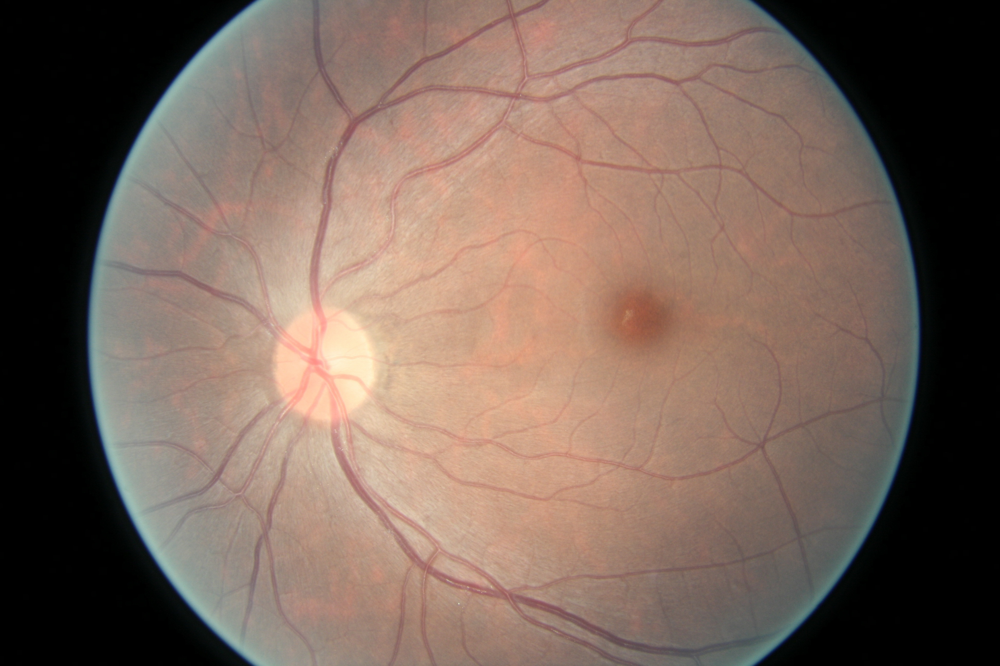

In [47]:
img = load_img('844_right.jpeg')
img

In [45]:
model.predict(img)

ValueError: Failed to find data adapter that can handle input: <class 'PIL.JpegImagePlugin.JpegImageFile'>, <class 'NoneType'>